### IMPORTING LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import shap
import re
import xgboost as xgb
import lightgbm as lgb
import matplotlib as mpl
from matplotlib import pyplot as plt
from datetime import datetime
import time

from collections import OrderedDict, Counter, defaultdict

from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import (roc_auc_score, confusion_matrix, mean_squared_error, precision_score,
                             f1_score, accuracy_score, recall_score, roc_curve, auc)
from sklearn.ensemble import (RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, 
                              VotingClassifier)
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone

shap.initjs()
%matplotlib inline
pd.options.display.max_columns = 999
mpl.rcParams['figure.dpi'] = 300


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [2]:
nimes = pd.read_csv ('nimes_dec_21.csv', low_memory=False)

In [3]:
pasient = pd.read_csv('pasient_dec_23.csv')
nsml = pd.read_csv('nsml_dec_21.csv')
trfl = pd.read_csv('trfl_dec_21.csv')
anino = pd.read_csv('anino_dec_21.csv')

In [16]:
explicitsepsis = ['A021','A207','A217','A227','A241','A267','A282','A327','A394','A40','A41','A427','B007','B377']

infection =['A00','A01','A02','A03','A04','A05','A06','A07','A08','A09','A19', 'A20','A21','A22','A23','A24','A25','A26','A27','A28','A30','A31','A32','A36','A37','A38','A39','A42', 'A43', 'A44', 'A46','A48','A49','A54','A59','A690','A691','A699','A70','A74',
            'A75','A77','A78','A79','A80','A81','A83','A84','A85','A86','A87', 'A88','A89','A90','A91','A92','A93','A94','A95','A96','A97','A98', 'A99','B00','B01','B02','B03','B04','B05','B06','B08','B09','B10','B25','B26','B27',
            'B33','B34','B37','B38','B39','B40','B41','B42','B43','B44','B45','B46','B48','B49','B50','B54','B55','B57','B58','B59','B60','B64','B67','B95','B96','B97','B99','G00','G01','G02','G03','G04','G05','G06','G07','G08','H050',
            'H602','H700','I00','I33','I38','I39','I400','J01','J02','J03','J04','J05','J06','J09','J10','J11','J12','J13','J14','J15','J16','J17','J18','J19','J20','J21','J22','J36','J390','J391','J85','J86','K35','K36','K37','K61','K630',
            'K631','K65','K750''K810', 'K830','L02','L03','L030','L04','L08','M00','M01','M86','N10','N151','N30','N390','N410','N412','N413','N45','N70','N71','N72','N73','N74', 'N980','O030','O035','O045','O080','O23','O753', 'O85',
            'O86','O883','O91','O98','R02','T802','T814','T826''T827','T835','T836','T845','T846','T847','T857','T880', 'U04', 'M726', 'N49', 'U071', 'U072']

organdysfunction = ['D695','E872','G934','I46','I959','J80','J952','J96','K720','K729','N00','N17','R090','R092','R400','R401','R402','R41', 'R55', 'R57', 'R651', 'R572']
                  
diabetes = ['E10', 'E11', 'E12', 'E13', 'E14']

cardiaovascular = ['G45', 'H34', 'I00', 'I01', 'I02', 'I03', 'I04', 'I05', 'I06', 'I07', 'I08', 'I09', 'I10', 'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'I17', 'I18', 'I19', 'I20', 'I21', 'I22', 'I23', 'I24', 'I25', 'I26', 'I27', 'I28', 'I29', 'I30',
                  'I31', 'I32', 'I33', 'I34', 'I35', 'I36', 'I37', 'I38', 'I39', 'I40', 'I41', 'I42', 'I43', 'I44', 'I45', 'I46', 'I47', 'I48', 'I49', 'I50', 'I51', 'I52', 'I53', 'I54', 'I55', 'I56', 'I57', 'I58', 'I59', 'I60',
                  'I61', 'I62', 'I63', 'I64', 'I65', 'I66', 'I67', 'I68', 'I69', 'I70', 'I71', 'I72', 'I73', 'I74', 'I75', 'I76', 'I77', 'I78', 'I79', 'I80', 'I81', '182', 'I83', 'I84', 'I85', 'I86', 'I87', 'I88', 'I89', 'I90', 'I91', 'I92', 'I93', 
                   'I94', 'I95', 'I96', 'I97', 'I98', 'I99']

cancer = ['C00', 'C01', 'C02', 'C03', 'C04', 'C05', 'C06', 'C07', 'C08', 'C09', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19','C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29',
         'C30', 'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37', 'C38', 'C39', 'C40', 'C41', 'C42', 'C43', 'C44', 'C45', 'C46', 'C47', 'C48', 'C49','C50', 'C51', 'C52', 'C53', 'C54', 'C55', 'C56', 'C57', 'C58', 'C59',
          'C60', 'C61', 'C62', 'C63', 'C64', 'C65', 'C66', 'C67', 'C68', 'C69', 'C70', 'C71', 'C72', 'C73', 'C74', 'C75', 'C76', 'C77', 'C78', 'C79','C80', 'C81', 'C82', 'C83', 'C84', 'C85', 'C86', 'C87', 'C88', 'C89',
         'C90', 'C91', 'C92', 'C93', 'C94', 'C95', 'C96', 'C97', 'D32', 'D33', 'D35', 'D42', 'D43', 'D44', 'D45', 'D46', 'D47' ]

lung = ['J41', 'J42', 'J43', 'J44', 'J45', 'J46', 'J47', 'J84', 'J98']

demetia = ['F00', 'F02', 'F03', 'G30', 'G31']

kidney_dialysis = ['N18']

liver = ['K70', 'K72']

immune_system = ['D80', 'D81', 'D82', 'D83', 'D84', 'Z94']

In [15]:
def preprocess_nimes(nimes):
    # Select relevant columns from the nimes table
    nimes = nimes[['ppid', 'episodeid', 'inndatotid', 'utdatotid', 'hastegradkode', 'omsorgsnivåkode', 'pdxkoder', 'sdxkoder', 'ncspkoder', 'ncmpkoder']].copy()
    
    # Replace empty strings with NaN and drop rows with NaN in the 'episodeid' column
    nimes['episodeid'].replace('', np.nan, inplace=True)
    nimes.dropna(subset=['episodeid'], inplace=True)

    # Group by ppid, inndatotid, and utdatotid, and reset index
    nimes = nimes.groupby(["ppid", "inndatotid", "utdatotid"]).last().reset_index()
    nimes.sort_values(by=['ppid', 'inndatotid', 'utdatotid'], inplace=True)
    nimes.reset_index(inplace=True)

    # Replace ';' and ',' with ' ' and de-duplicate items in each row for the given columns
    for col in ['pdxkoder', 'sdxkoder', 'ncspkoder', 'ncmpkoder']:
        nimes[col].replace([';', ','], ' ', regex=True, inplace=True)
        nimes[col] = nimes[col].str.split().apply(lambda x: ' '.join(OrderedDict.fromkeys(x).keys()) if x is not None else '')
    
    # Fill NaN values with empty strings
    nimes.fillna('', inplace=True)

    # Convert inndatotid and utdatotid to datetime objects
    nimes.iloc[:, 2:4] = nimes.iloc[:, 2:4].apply(pd.to_datetime, errors='coerce')

    # Calculate the length of stay (LOS) in days
    nimes['LOS'] = ((nimes['utdatotid'] - nimes['inndatotid']).astype('timedelta64[h]'))/24

    # Drop duplicate rows based on ppid, inndatotid, and utdatotid columns
    nimes.drop_duplicates(subset=['ppid', 'inndatotid', 'utdatotid'], keep='last', inplace=True)

    # Function to merge two columns and remove duplicates
    def merge_and_deduplicate_columns(df, col1, col2, new_col_name):
        df[new_col_name] = (df[col1] + ' ' + df[col2]).str.split().apply(lambda x: ' '.join(OrderedDict.fromkeys(x).keys()))
        df.drop(columns=[col1, col2], inplace=True)

    # Merge and de-duplicate pdxkoder and sdxkoder columns into a new ICD column
    merge_and_deduplicate_columns(nimes, 'pdxkoder', 'sdxkoder', 'ICD')

    # Merge and de-duplicate ncspkoder and ncmpkoder columns into a new Procedure column
    merge_and_deduplicate_columns(nimes, 'ncspkoder', 'ncmpkoder', 'Procedure')

    # Rename columns for clarity
    nimes.rename(columns={"index": "epid", "hastegradkode": "severity", "omsorgsnivåkode": "visit_type"}, inplace=True)

    # Calculate the time since the last visit in hours
    nimes['time_to_last'] = nimes['inndatotid'].diff().astype('timedelta64[h]').fillna(0)
    nimes.loc[nimes['time_to_last'].astype(int) < -720, 'time_to_last'] = 0
    
    return nimes


nimess = preprocess_nimes(nimes)


In [8]:
nimess

,epid,ppid,inndatotid,utdatotid,episodeid,severity,visit_type,LOS,ICD,Procedure,time_to_last
0,0,1,2012-10-02 09:00:00,2012-10-02 09:38:00,341261.0,4,3,0.000000,J449,GDFX15 FYFX05 GDFC05,0.0
1,1,1,2012-12-14 09:46:00,2012-12-21 16:30:00,727988.0,1,1,7.250000,I269 J189 J449 E039 I64,,1752.0
2,2,1,2013-02-12 17:10:00,2013-02-12 20:00:00,869781.0,2,3,0.083333,I269,,1447.0
3,3,1,2013-07-08 14:30:00,2013-07-08 15:00:00,883667.0,4,3,0.000000,J449,FYFX05 GDFC00,3501.0
4,4,1,2013-09-12 10:00:00,2013-09-12 11:20:00,533137.0,4,3,0.041667,I714,,1579.0
...,...,...,...,...,...,...,...,...,...,...,...
1328180,1328180,36352,2014-12-10 09:30:00,2014-12-10 10:30:00,1285388.0,4,3,0.041667,Z032 X6n0,ZWAA10 IAAI00,29.0
1328181,1328181,36352,2015-06-08 08:00:00,2015-06-08 09:00:00,1285897.0,4,3,0.041667,Z004,,4318.0
1328182,1328182,36352,2016-08-10 17:52:00,2016-08-10 18:17:00,1285771.0,1,3,0.000000,S400 G563,,10305.0
1328183,1328183,36352,2016-08-18 20:23:00,2016-08-24 15:40:00,1285690.0,1,1,5.791667,F102 F132,,194.0


This code iterates over the conditions and their respective ICD codes, creating a flag column for each condition by checking if any of the codes appear in the 'ICD' column. For the implicit sepsis flag, the code uses the bitwise AND operator to mark episodes that meet both the infection and organ dysfunction conditions. The get_condition_label function assigns the appropriate label based on the flags, and the code creates the 'label' column by applying this function to the dataframe.

In [17]:
# Create a dictionary to map condition names to ICD codes
conditions = {
    'explicit_sepsis': explicitsepsis,
    'infection': infection,
    'organ_dysfunction': organdysfunction,
    'diabetes': diabetes,
    'cardiovascular': cardiaovascular,
    'cancer': cancer,
    'lung': lung,
    'dementia': demetia,
    'kidney_dialysis': kidney_dialysis,
    'liver': liver,
    'immune_system': immune_system
}

# Create flags for each condition using masks
for condition, codes in conditions.items():
    nimess[f"{condition}_flag"] = nimess['ICD'].apply(lambda x: any(item for item in codes if item in x))

# Mark episodes with implicit sepsis, defined by the occurrence of infection and organ dysfunction ICD codes in a single episode
nimess['implicit_sepsis_flag'] = nimess['infection_flag'] & nimess['organ_dysfunction_flag']

# Define a function to return the condition label for each row based on the flags
def get_condition_label(row):
    if row["explicit_sepsis_flag"]:
        return "Explicit Sepsis"
    if row["implicit_sepsis_flag"]:
        return "Implicit Sepsis"
    for condition in conditions.keys():
        if row[f"{condition}_flag"]:
            return condition.capitalize().replace('_', ' ')
    return 'Other'

# Apply the function to create the 'label' column
nimess['label'] = nimess.apply(get_condition_label, axis=1)


In [12]:
nimess.label.value_counts()

Other                673822
Cancer               278089
Cardiovascular       122673
Kidney dialysis       83887
Infection             75877
Diabetes              34468
Lung                  22387
Organ dysfunction     12017
Immune system         10431
Implicit Sepsis        6041
Explicit Sepsis        5159
Dementia               2948
Liver                   386
Name: label, dtype: int64

In [14]:
anino.columns

Index(['ppid', 'aninoppholdstart', 'aninoppholdslutt', 'sesjonstart',
       'sesjonslutt', 'behandlingsstedstart', 'behandlingsstedslutt',
       'behandlingsstedkode', 'avdelingkode', 'sesjontypekode',
       'stagelineageid'],
      dtype='object')

In [13]:
# Create a new DataFrame with the relevant columns
anino2 = anino[['ppid', 'aninoppholdstart', 'aninoppholdslutt']].copy()

# Convert date columns to datetime objects
anino2[['aninoppholdstart', 'aninoppholdslutt']] = anino2[['aninoppholdstart', 'aninoppholdslutt']].apply(pd.to_datetime, errors='coerce')

# Calculate ICU Length of Stay (LOS) in hours
anino2['ICU_LOS'] = (anino2['aninoppholdslutt'] - anino2['aninoppholdstart']).astype('timedelta64[h]')

# Calculate ICU admission count per patient
anino2['ICU_admission_count'] = anino2.groupby('ppid')['ppid'].transform('count')

# Sort the DataFrame by patient ID, admission start time, and admission end time
anino2 = anino2.sort_values(by=['ppid', 'aninoppholdstart', 'aninoppholdslutt'])

# Remove duplicate rows, keeping the last one
anino2 = anino2.drop_duplicates(subset=['ppid', 'aninoppholdstart', 'aninoppholdslutt'], keep='last')

# Reset the index and add a new 'icuid' column
anino2 = anino2.reset_index()
anino2 = anino2.rename(columns={"index": "icuid"})

This code first groups the nimess table by the 'ppid' column. Then, it iterates through the ICU admissions in the anino2 table and finds the corresponding episode in the nimess table based on the admission start and end times. If a matching episode is found, the 'episode_id' column of the anino2 table is set to the index of the matching episode.

In [ ]:
# Step 3: Add ICU_LOS per episode into nimess table

# Define a function to find the corresponding episode for an ICU admission
def find_matching_episode(icu_admission, nimess):
    mask = (nimess['ppid'] == icu_admission['ppid']) & (nimess['inndatotid'] <= icu_admission['aninoppholdstart']) & (nimess['utdatotid'] >= icu_admission['aninoppholdslutt'])
    if mask.any():
        return nimess.loc[mask, 'episodeid'].iloc[0]
    else:
        return None

# Apply the find_matching_episode function to get the corresponding episodes for all ICU admissions in anino2
anino2['episodeid'] = anino2.apply(lambda x: find_matching_episode(x, nimess), axis=1)

# Group the anino2 table by the episode_id and calculate the total ICU_LOS per episode
icu_los_by_episode = anino2.groupby('episodeid')['ICU_LOS'].sum()

# Add the ICU_LOS column to nimess table, filling NaN values with 0
nimess = nimess.merge(icu_los_by_episode, left_on='episodeid', right_on='episodeid', how='left')
nimess['ICU_LOS'].fillna(0, inplace=True)

In [39]:
anino2

,icuid,ppid,aninoppholdstart,aninoppholdslutt,ICU_LOS,ICU_admission_count,episodeid
0,11579,1,2013-10-09 13:10:38.000,2013-10-10 11:09:35.000,21.0,3,227313.0
1,24279,1,2014-12-30 14:26:22.000,2014-12-31 00:53:56.000,10.0,3,NaN
2,107993,2,2018-11-22 10:57:41.000,2018-11-22 14:02:20.000,3.0,4,1233809.0
3,130192,2,2019-11-18 14:38:48.350,2019-11-18 16:39:08.000,2.0,4,483974.0
4,43490,3,2016-01-07 07:31:28.000,2016-01-07 18:09:07.000,10.0,24,1107864.0
...,...,...,...,...,...,...,...
71214,122049,36343,2019-07-04 07:09:25.833,2019-07-06 14:39:47.533,55.0,6,1092945.0
71215,11244,36351,2013-07-18 08:18:40.000,2013-07-18 15:12:28.000,6.0,5,675890.0
71216,37974,36351,2015-10-01 08:44:51.000,2015-10-02 09:53:59.000,25.0,5,611848.0
71217,23377,36352,2014-12-09 05:18:51.000,2014-12-10 13:08:37.000,31.0,1,1286006.0


In [28]:
nsml

,reqs_year,reqs_no,ppid,anre_status,date_req,matr_desc,anly_result,micr_code,micr_prt_name,ande_code,ande_name,anre_no,stagelineageid
0,20,5596,34564,A,2020-01-13,Blodkultur,,STPY,STREPTOCOCCUS PYOGENES ...,RESA,Resistensbestemmelse :,1,123905
1,20,5596,34564,A,2020-01-13,Blodkultur,,STPY,STREPTOCOCCUS PYOGENES ...,RESA,Resistensbestemmelse :,2,123905
2,20,5596,34564,A,2020-01-13,Blodkultur,,STPY,STREPTOCOCCUS PYOGENES ...,RESA,Resistensbestemmelse :,3,123905
3,20,5596,34564,A,2020-01-13,Blodkultur,,STPY,STREPTOCOCCUS PYOGENES ...,RESA,Resistensbestemmelse :,4,123905
4,20,5596,34564,A,2020-01-13,Blodkultur,,STPY,STREPTOCOCCUS PYOGENES ...,RESA,Resistensbestemmelse :,5,123905
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1976169,17,115504,15146,A,2017-08-08,Sårsekret,IV,,NaN,VDY,Virus dyrkning :,1,123905
1976170,17,115504,15146,A,2017-08-08,Sårsekret,N,,NaN,VZP,Varicella Zoster virus - PCR :,1,123905
1976171,15,174616,15146,A,2015-11-30,Blodkultur,NEGATIV,,NaN,BA1,Blodkultur aerob dyrkning :,1,123905
1976172,15,174616,15146,A,2015-11-30,Blodkultur,NEGATIV,,NaN,BN1,Blodkultur anaerob dyrkning:,1,123905


In [4]:
trfl['ande_name'].unique()

array(['Trombocytter                  ', 'CRP                           ',
       'Leukocytter                   ', 'CRP-høysensitiv               ',
       'Kreatinin                     ', 'Bilirubin total               ',
       'pH                            ', 'Laktat blodgass               ',
       'Bilirubin ukonjugert          ', 'Bilirubin konjugert           ',
       'Trombocyttantistoff           ', 'Laktat blodgass venøst        ',
       'Laktat                        ', 'Trombocyttforlik              ',
       'pO2                           ', 'pH PNA                        ',
       'pO2 PNA                       ', 'Laktat PNA                    '],
      dtype=object)

In [30]:
trfl.ande_name.value_counts()

Leukocytter                       717579
Kreatinin                         689344
CRP                               663799
Trombocytter                      486149
Bilirubin total                   214845
pH                                 19492
Laktat blodgass                     9326
CRP-høysensitiv                     7234
Bilirubin konjugert                 1267
Bilirubin ukonjugert                 970
Laktat                               793
Laktat blodgass venøst               693
Trombocyttantistoff                  350
pH PNA                               338
pO2 PNA                              338
Laktat PNA                           337
Trombocyttforlik                     104
pO2                                    3
Name: ande_name, dtype: int64

considering the entire conversation and code till now, 
The nsml ard trfl are two tables containing results of microbiology and laboratory tests respectively.
the columns of nsml and trfl are as under 
nsml -'reqs_year', 'reqs_no', 'ppid', 'anre_status', 'date_req', 'matr_desc',
       'anly_result', 'micr_code', 'micr_prt_name', 'ande_code', 'ande_name',
       'anre_no', 'stagelineageid'
trfl -'reqs_year', 'reqs_no', 'ppid', 'ande_code', 'anly_result',
       'result_ctr_flag', 'high_reference', 'low_reference', 'ande_name',
       'matr_code', 'date_req', 'date_coll', 'reqr_code_prim', 'reqr_name',
       'stagelineageid'       
the ppids are same as in nimess and anino2 

In the nsml table each test has a unique 'reqs_no' and 'matr_desc' is the name of the test. 'date_req' is the date of the test stored as object '2020-01-13' format.
Now do the following,
1. convert date_req column to datetime format and note  values are only date in nsml.
2. add new columns to nimess as microbiology_test and microbiology_test_result
2a. match the date_req with the episode timings in nimess and if a date_req of a test lie between or overlap the in and out dates of nimess episodes then
add the value in microbiology_test column for that episode from the matr_desc column value from nsml table. If there are more test then add there values for matr_desc as well but keeping only the unique values among all the collected values.
2b. add the value in microbiology_test_result column for that episode in nimess from the micr_prt_name column value from nsml table. If there are more test then add there values as micr_prt_name as well but keep only the unique values among all the collected values. that is to say check if the new value already exist in the present episode for the column microbiology_test_result

Next, consider the trfl table,
In the trfl table each test has a unique 'reqs_no' and each reqs_no has a collection of lab test values named under column 'ande_name'.
the value_count function for different ande_name is as given below: Leukocytter                       717579

Kreatinin                         689344
CRP                               663799
Trombocytter                      486149
Bilirubin total                   214845
pH                                 19492
Laktat blodgass                     9326
CRP-høysensitiv                     7234
Bilirubin konjugert                 1267
Bilirubin ukonjugert                 970
Laktat                               793
Laktat blodgass venøst               693
Trombocyttantistoff                  350
pH PNA                               338
pO2 PNA                              338
Laktat PNA                           337
Trombocyttforlik                     104
pO2                                    3
Name: ande_name, dtype: int64

Now do the following,
1. convert date_req column in trfl to datetime note the date in trfl column is stored as object in this format - 20161214
2. add new columns to nimess neamed as average followwed by underscore and then the name of each ande_name test, so 17 total and for example 'average_Kreatinin', 'average_CRP'...
3. match the date_req, the date of test witht the in out timing in nimess and if a test date lies in between the two dates or overlaps the date then 
calculate the average over all the ande_name in that test and add these as new values in the nimess columns with respective ande_name name.

write comments describing each part of the code.
Follow correct coding norms and principles 
Make sure it is efficient and look out for time complexity rising too high.

Good luck I am sure you will do the best and not make any mistakes 

In [32]:
# Add new columns to nimess
nimess['microbiology_test'] = None
nimess['microbiology_test_result'] = None

# Step 1: Add microbiology test information to nimess
for idx, episode in nimess.iterrows():
    overlapping_nsml = nsml[(nsml['ppid'] == episode['ppid']) &
                            (nsml['date_req'] >= episode['inndatotid']) &
                            (nsml['date_req'] <= episode['utdatotid'])]

    if not overlapping_nsml.empty:
        unique_tests = overlapping_nsml['matr_desc'].unique()
        unique_results = overlapping_nsml['micr_prt_name'].unique()
        nimess.at[idx, 'microbiology_test'] = ", ".join(str(test) for test in unique_tests)
        nimess.at[idx, 'microbiology_test_result'] = ", ".join(str(result) for result in unique_results)

# Function to clean the anly_result column values
def clean_anly_result(value):
    # Remove non-numeric characters
    cleaned_value = re.sub('[^0-9,.]', '', value)
    
    # Replace ',' with '.'
    cleaned_value = cleaned_value.replace(',', '.')

    return cleaned_value

# Assuming that you have loaded and preprocessed nimess and anino2
# Preprocess nsml and trfl
nsml['date_req'] = pd.to_datetime(nsml['date_req'], errors='coerce')
trfl['date_req'] = pd.to_datetime(trfl['date_req'], format='%Y%m%d', errors='coerce')

# Clean the anly_result column in trfl
trfl['anly_result_cleaned'] = trfl['anly_result'].apply(clean_anly_result).apply(pd.to_numeric, errors='coerce')

# Add new columns to nimess
nimess['microbiology_test'] = None
nimess['microbiology_test_result'] = None

# Step 1: Add microbiology test information to nimess
for idx, episode in nimess.iterrows():
    overlapping_nsml = nsml[(nsml['ppid'] == episode['ppid']) &
                            (nsml['date_req'] >= episode['inndatotid']) &
                            (nsml['date_req'] <= episode['utdatotid'])]

    if not overlapping_nsml.empty:
        unique_tests = overlapping_nsml['matr_desc'].unique()
        unique_results = overlapping_nsml['micr_prt_name'].unique()
        nimess.at[idx, 'microbiology_test'] = ", ".join(str(test) for test in unique_tests)
        nimess.at[idx, 'microbiology_test_result'] = ", ".join(str(result) for result in unique_results)


# Step 2: Add average lab test results to nimess
lab_tests = trfl['ande_name'].unique()

for test in lab_tests:
    # Add new column to nimess for average lab test result
    nimess[f'average_{test}'] = None

for idx, episode in nimess.iterrows():
    # Find tests that overlap with the episode in trfl
    overlapping_tests = trfl[(trfl['ppid'] == episode['ppid']) &
                             (trfl['date_req'] >= episode['inndatotid']) &
                             (trfl['date_req'] <= episode['utdatotid'])]
    
    if not overlapping_tests.empty:
        # Group overlapping tests by ande_name
        grouped_tests = overlapping_tests.groupby('ande_name')

        # Calculate the average lab test result for each group and add it to nimess
        for test, group in grouped_tests:
            nimess.at[idx, f'average_{test}'] = group['anly_result_cleaned'].mean()


In [33]:
nimess.to_csv('episodelog_200423.csv')

In [19]:
nimess2 = pd.read_csv ('episodelog_200423.csv', low_memory=False)

In [238]:
nimess.columns

Index(['epid', 'ppid', 'inndatotid', 'utdatotid', 'episodeid', 'severity',
       'visit_type', 'LOS', 'ICD', 'Procedure', 'time_to_last',
       'explicit_sepsis_flag', 'infection_flag', 'organ_dysfunction_flag',
       'diabetes_flag', 'cardiovascular_flag', 'cancer_flag', 'lung_flag',
       'dementia_flag', 'kidney_dialysis_flag', 'liver_flag',
       'immune_system_flag', 'implicit_sepsis_flag', 'label',
       'average_Laktat blodgass               ',
       'average_Bilirubin ukonjugert          ',
       'average_Trombocyttantistoff           ',
       'average_CRP-høysensitiv               ',
       'average_Laktat                        ',
       'average_CRP                           ',
       'average_pH PNA                        ',
       'average_Laktat PNA                    ',
       'average_Kreatinin                     ',
       'average_Trombocyttforlik              ',
       'average_Bilirubin konjugert           ', 'ICU_LOS_x',
       'average_pO2                

In [239]:
nimess2.columns

Index(['Unnamed: 0', 'epid', 'ppid', 'inndatotid', 'utdatotid', 'episodeid',
       'severity', 'visit_type', 'LOS', 'ICD', 'Procedure', 'time_to_last',
       'explicit_sepsis_flag', 'infection_flag', 'organ_dysfunction_flag',
       'diabetes_flag', 'cardiovascular_flag', 'cancer_flag', 'lung_flag',
       'dementia_flag', 'kidney_dialysis_flag', 'liver_flag',
       'immune_system_flag', 'implicit_sepsis_flag', 'label', 'ICU_LOS',
       'microbiology_test', 'microbiology_test_result',
       'average_Trombocytter                  ',
       'average_CRP                           ',
       'average_Leukocytter                   ',
       'average_CRP-høysensitiv               ',
       'average_Kreatinin                     ',
       'average_Bilirubin total               ',
       'average_pH                            ',
       'average_Laktat blodgass               ',
       'average_Bilirubin ukonjugert          ',
       'average_Bilirubin konjugert           ',
       'average_

In [22]:
# Find the columns to add from nimess2 to nimess
cols_to_add = set(nimess2.columns) - set(nimess.columns) - {'Unnamed: 0'}

# Add the new columns from nimess2 to nimess
nimess = nimess.merge(nimess2[['ppid', 'episodeid'] + list(cols_to_add)], on=['ppid', 'episodeid'], how='left')


In [254]:
nimess.head(30)

,epid,ppid,inndatotid,utdatotid,episodeid,severity,visit_type,LOS,ICD,Procedure,time_to_last,explicit_sepsis_flag,infection_flag,organ_dysfunction_flag,diabetes_flag,cardiovascular_flag,cancer_flag,lung_flag,dementia_flag,kidney_dialysis_flag,liver_flag,immune_system_flag,implicit_sepsis_flag,label,average_Laktat blodgass,average_Bilirubin ukonjugert,average_Trombocyttantistoff,average_CRP-høysensitiv,average_Laktat,average_CRP,average_pH PNA,average_Laktat PNA,average_Kreatinin,average_Trombocyttforlik,average_Bilirubin konjugert,ICU_LOS_x,average_pO2,average_Leukocytter,microbiology_test_result,average_pH,average_Laktat blodgass venøst,average_Bilirubin total,average_pO2 PNA,average_Trombocytter,microbiology_test,ICU_LOS_y,readmission
0,0,1,2012-10-02 09:00:00,2012-10-02 09:38:00,341261.0,4,3,0.000000,J449,GDFX15 FYFX05 GDFC05,0.0,False,False,False,False,False,False,True,False,False,False,False,False,Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,1,1,2012-12-14 09:46:00,2012-12-21 16:30:00,727988.0,1,1,7.250000,I269 J189 J449 E039 I64,,1752.0,False,True,False,False,True,False,True,False,False,False,False,False,Infection,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,2,1,2013-02-12 17:10:00,2013-02-12 20:00:00,869781.0,2,3,0.083333,I269,,1447.0,False,False,False,False,True,False,False,False,False,False,False,False,Cardiovascular,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,3,1,2013-07-08 14:30:00,2013-07-08 15:00:00,883667.0,4,3,0.000000,J449,FYFX05 GDFC00,3501.0,False,False,False,False,False,False,True,False,False,False,False,False,Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,4,1,2013-09-12 10:00:00,2013-09-12 11:20:00,533137.0,4,3,0.041667,I714,,1579.0,False,False,False,False,True,False,False,False,False,False,False,False,Cardiovascular,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
5,5,1,2013-09-12 11:30:00,2013-09-12 11:45:00,224199.0,4,3,0.000000,R31,UKC02,1.0,False,False,False,False,False,False,False,False,False,False,False,False,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
6,6,1,2013-10-08 10:36:00,2013-10-12 13:11:00,227313.0,4,1,4.083333,C679 J449 E039 I64,KCD02,623.0,False,False,False,False,True,True,True,False,False,False,False,False,Cardiovascular,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,NaN,NaN,21.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.0,1
7,7,1,2013-11-15 13:00:00,2013-11-15 13:37:00,782666.0,4,3,0.000000,J449,,914.0,False,False,False,False,False,False,True,False,False,False,False,False,Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
8,8,1,2013-11-15 13:24:00,2013-11-21 15:15:00,207075.0,1,1,6.041667,C349 J189 I269 J440,,0.0,False,True,False,False,True,True,True,False,False,False,False,False,Infection,NaN,NaN,NaN,NaN,NaN,15.800000,NaN,NaN,70.4,NaN,NaN,0.0,NaN,9.900000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
9,9,1,2013-12-12 13:30:00,2013-12-12 14:24:00,795035.0,4,3,0.000000,C349,,648.0,False,False,False,False,False,True,False,False,False,False,False,False,Cancer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [123]:
nimess_last = nimess.groupby('ppid', as_index=False).nth(-1)
nimess_except_last = nimess[~nimess.epid.isin(nimess_last.epid)]
nimess_except_last.ppid.nunique()

34214

In [124]:
visit_types = {3: 'visit', 1: 'admission', 2: 'daycare', 8: 'inpatient'}

# Create a copy of the nimess_except_last DataFrame with only required columns
nimess_counts = nimess_except_last[['ppid', 'visit_type']].copy()

# Calculate the visit counts for each visit type
visit_counts_pivot = pd.pivot_table(nimess_counts, index='ppid', columns='visit_type', aggfunc='size', fill_value=0)
visit_counts_pivot.columns = [visit_types[col] + '_count' for col in visit_counts_pivot.columns]

nimess_except_last['entry_count'] = nimess_except_last.groupby('ppid')['ppid'].transform('count')
nimess_tf = nimess_except_last.groupby(['ppid', 'entry_count'], as_index=False)['LOS'].sum()
nimess_labelLOS = nimess.groupby(['ppid', 'label'], as_index=False)['LOS'].sum()
labelLOS_table = pd.pivot_table(nimess_labelLOS, values='LOS',columns=['label'], index='ppid')
CaseLog = pd.merge(nimess_tf, labelLOS_table, on=['ppid'], how='left')

CaseLog = pd.merge(CaseLog, visit_counts_pivot, on='ppid', how='left')
CaseLog.shape


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(34214, 20)

CALCULATING NUMBER OF DIFFERENT DISEASE EPISODES (BASED ON LABELS)

In [126]:
# List of flags to sum
flags = ['explicit_sepsis_flag', 'infection_flag', 'implicit_sepsis_flag', 'diabetes_flag',
         'cardiovascular_flag', 'cancer_flag', 'lung_flag', 'organ_dysfunction_flag',
         'kidney_dialysis_flag', 'liver_flag', 'dementia_flag', 'immune_system_flag']

# Sum all flags for each ppid
nimess_flags_sum = nimess_except_last.groupby('ppid', as_index=False)[flags].sum()

# Merge the flags DataFrame with CaseLog
CaseLog = pd.merge(CaseLog, nimess_flags_sum, on='ppid', how='left')

CALCULATING AVERAGE TIME BETWEEN last three EPISODES

In [127]:
# Group by ppid and entry_count and sum time_to_last
nimess_tinb = nimess_except_last.groupby(['ppid', 'entry_count'], as_index=False)['time_to_last'].sum()

# Calculate average time in between episodes
nimess_tinb['avg_time_in_between'] = nimess_tinb['time_to_last'] / nimess_tinb['entry_count']

# Calculate average time in between the last three episodes
nimess_tinb_last_three = nimess_except_last.sort_values(by=['ppid', 'inndatotid'], ascending=[True, False]).groupby('ppid').head(3)
nimess_tinb_last_three = nimess_tinb_last_three.groupby('ppid', as_index=False)['time_to_last'].mean()
nimess_tinb_last_three = nimess_tinb_last_three.rename(columns={'time_to_last': 'avg_time_in_between_last_three'})

# Drop unnecessary columns and rename the remaining ones
nimess_tinb = nimess_tinb.drop(columns=['entry_count'])
nimess_tinb = nimess_tinb.rename(columns={"time_to_last": "total_time_between"})

# Merge the DataFrames with CaseLog
CaseLog = pd.merge(CaseLog, nimess_tinb, on=['ppid'], how='left')
CaseLog = pd.merge(CaseLog, nimess_tinb_last_three, on=['ppid'], how='left')


CALCULATING LENGTH OF HISTORY

In [128]:
# Calculate the first and last entry dates per patient
nimess_firsts = nimess_except_last.groupby('ppid', as_index=False).first()
nimess_lasts = nimess_except_last.groupby('ppid', as_index=False).last()

# Extract the ppid and inndatotid columns and rename the columns
nimess_firsts = nimess_firsts[['ppid', 'inndatotid']].rename(columns={"inndatotid": "first_entry"})
nimess_lasts = nimess_lasts[['ppid', 'inndatotid']].rename(columns={"inndatotid": "last_entry"})

# Merge firsts_lasts and CaseLog
firsts_lasts = pd.merge(nimess_firsts, nimess_lasts, on=['ppid'], how='left')
CaseLog = pd.merge(CaseLog, firsts_lasts, on=['ppid'])

# Calculate the length of history
CaseLog['Length_of_history'] = (CaseLog['last_entry'] - CaseLog['first_entry']) / np.timedelta64(1, 'D')

ADDING FEATURES FROM THE LAST VISIT

In [129]:
# Get the last record for each patient and select relevant columns
nimess_last = nimess.groupby('ppid', as_index=False).last()
nimess_time_to_last = nimess_last[['ppid', 'time_to_last', 'severity', 'visit_type']].copy()

# Rename columns to reflect the last episode
nimess_time_to_last = nimess_time_to_last.rename(
    columns={
        "severity": "severity_previous",
        "visit_type": "visit_type_previous",
        "time_to_last": "time_to_previous"
    }
)

# Merge the nimess_time_to_last DataFrame with CaseLog
CaseLog = pd.merge(CaseLog, nimess_time_to_last, on=['ppid'], how='left')


In [130]:
nimess.columns

Index(['epid', 'ppid', 'inndatotid', 'utdatotid', 'episodeid', 'severity',
       'visit_type', 'LOS', 'ICD', 'Procedure', 'time_to_last',
       'explicit_sepsis_flag', 'infection_flag', 'organ_dysfunction_flag',
       'diabetes_flag', 'cardiovascular_flag', 'cancer_flag', 'lung_flag',
       'dementia_flag', 'kidney_dialysis_flag', 'liver_flag',
       'immune_system_flag', 'implicit_sepsis_flag', 'label',
       'average_Laktat blodgass               ',
       'average_Bilirubin ukonjugert          ',
       'average_Trombocyttantistoff           ',
       'average_CRP-høysensitiv               ',
       'average_Laktat                        ',
       'average_CRP                           ',
       'average_pH PNA                        ',
       'average_Laktat PNA                    ',
       'average_Kreatinin                     ',
       'average_Trombocyttforlik              ',
       'average_Bilirubin konjugert           ', 'ICU_LOS_x',
       'average_pO2                

In [161]:
# Get the last record for each patient and select relevant columns
nimess_last = nimess.groupby('ppid', as_index=False).last()
nimess_features_last = nimess_last[['ppid', 'ICU_LOS_y', 'LOS']].copy()

# Rename columns to reflect the last episode
nimess_features_last = nimess_features_last.rename(
    columns={
        "ICU_LOS_y": "ICU_LOS_last",
        "LOS": "LOS_last"
    }
)

# Merge the nimess_time_to_last DataFrame with CaseLog
CaseLog = pd.merge(CaseLog, nimess_features_last, on=['ppid'], how='left')

ADDING FEATURES FROM SECOND LAST AND THIRD LAST VISIT

In [132]:
# Getting the second last episode
nimess_last = nimess.groupby('ppid', as_index=False).last()
nimess_last_index = nimess_last.epid.unique().tolist()
nimess_except_last = nimess[~nimess.epid.isin(nimess_last_index)]

nimess_second_last = nimess_except_last.groupby('ppid', as_index=False).last()
nimess_time_to_secondlast = nimess_second_last[['ppid', 'time_to_last', 'severity', 'visit_type', 'LOS']].copy()
nimess_time_to_secondlast = nimess_time_to_secondlast.rename(columns={
    "severity": "severity_2ndlast",
    "visit_type": "visit_type_2ndlast",
    "time_to_last": "time_between_last_2last",
    "LOS": "LOS_2ndLast"
})

CaseLog = pd.merge(CaseLog, nimess_time_to_secondlast, on=['ppid'], how='left')

# Getting the third last episode
nimess_second_last_index = nimess_second_last.epid.unique().tolist()
nimess_except_second_last = nimess_except_last[~nimess_except_last.epid.isin(nimess_second_last_index)]

nimess_third_last = nimess_except_second_last.groupby('ppid', as_index=False).last()
nimess_time_to_thirdlast = nimess_third_last[['ppid', 'time_to_last', 'severity', 'visit_type', 'LOS']].copy()
nimess_time_to_thirdlast = nimess_time_to_thirdlast.rename(columns={
    "severity": "severity_3rdlast",
    "visit_type": "visit_type_3rdlast",
    "time_to_last": "time_between_2last_3last",
    "LOS": "LOS_3rdLast"
})

CaseLog = pd.merge(CaseLog, nimess_time_to_thirdlast, on=['ppid'], how='left')


ADDING FEATURE - ICU TIME DATA EXCEPT THE LAST ENTRY

In [133]:
# Getting the last entry for each patient in the anino2 and nimess DataFrames
anino2_last = anino2.groupby('ppid', as_index=False).last()
nimess_last = nimess.groupby('ppid', as_index=False).last()

# Merging anino2_last and nimess_last based on the 'ppid' column
combined_last_entries = pd.merge(anino2_last[['ppid', 'icuid', 'episodeid']], nimess_last[['ppid', 'episodeid']], on='ppid', suffixes=('_anino2', '_nimess'))

# Removing the last entry in anino2 if it matches the last entry in nimess
anino2_except_last = anino2[~(anino2['ppid'].isin(combined_last_entries.loc[combined_last_entries['episodeid_anino2'] == combined_last_entries['episodeid_nimess'], 'ppid']) & anino2['icuid'].isin(combined_last_entries.loc[combined_last_entries['episodeid_anino2'] == combined_last_entries['episodeid_nimess'], 'icuid']))]

# Counting the number of ICU visits for each patient
anino2_except_last = anino2_except_last.assign(ICU_visit_count=anino2_except_last.groupby('ppid')['ppid'].transform('count'))

# Summing the ICU length of stay for each patient
anino2_except_last_tf = anino2_except_last.groupby(['ppid', 'ICU_visit_count'], as_index=False)['ICU_LOS'].sum()

# Merging the resulting DataFrame with CaseLog
CaseLog = pd.merge(CaseLog, anino2_except_last_tf, on=['ppid'], how='left')

ADDING FEATURE - AGE AT FIRST AND LAST EPISODE

In [134]:
# Merge pasient2 with CaseLog
pasient.iloc[:, 3:4] = pasient.iloc[:, 3:4].apply(pd.to_datetime, errors='coerce')
pasient2 = pasient.drop(columns=['fødtår', 'dødsdato'])
CaseLog = pd.merge(CaseLog, pasient2, on=['ppid'], how='left')

# Calculate age at first visit
nimess_firsts = nimess.groupby('ppid', as_index=False).first() 
nimess_firsts = pd.merge(nimess_firsts, pasient, on=['ppid'])
nimess_firsts['age_at_first_visit'] = nimess_firsts['inndatotid'].dt.year - nimess_firsts['fødtår']

# Calculate age at last visit
nimess_lasts = nimess.groupby('ppid', as_index=False).last() 
nimess_lasts = pd.merge(nimess_lasts, pasient, on=['ppid'])
nimess_lasts['age_at_last_visit'] = nimess_lasts['inndatotid'].dt.year - nimess_lasts['fødtår']

# Merge age features with CaseLog
CaseLog = pd.merge(CaseLog, nimess_firsts[['ppid', 'age_at_first_visit']], on=['ppid'], how='left')
CaseLog = pd.merge(CaseLog, nimess_lasts[['ppid', 'age_at_last_visit']], on=['ppid'], how='left')

# Calculate total LOS under different severity states
time_under = nimess.groupby(['ppid', 'severity'], as_index=False)['LOS'].sum()
severity_LOS_table = pd.pivot_table(time_under, values='LOS', columns=['severity'], index='ppid')

# Merge severity_LOS_table with CaseLog
CaseLog = pd.merge(CaseLog, severity_LOS_table, on=['ppid'], how='left')

ADDING NSML AND BCR COUNT FEATURES - TOTAL NUMBER OF, TEST, POSITIVE RESULTS, BCT, BCPR (BLOOD CULTURE POSITIVE RESULTS)

In [135]:
def count_tests(df, test_condition=None):
    if test_condition:
        df = df.loc[test_condition(df)]
        
    test_counts = df[['reqs_no', 'ppid']].drop_duplicates()
    test_counts['count'] = test_counts.groupby('ppid')['ppid'].transform('count')
    test_counts = test_counts.drop(['reqs_no'], axis=1).drop_duplicates()

    return test_counts


# NSML test and positive test counts
nsml_test = count_tests(nsml)
nsml_positive_test = count_tests(nsml, lambda x: ~x['micr_prt_name'].isnull())

nsml_counts = pd.merge(nsml_test.rename(columns={"count": "nsml_test_count"}),
                       nsml_positive_test.rename(columns={"count": "nsml_positive_test_count"}),
                       on=['ppid'], how='left')

# BCR test and positive test counts
bcr = nsml.loc[nsml.matr_desc == 'Blodkultur               ']
bcr_test = count_tests(bcr)
bcr_positive_test = count_tests(bcr, lambda x: ~x['micr_prt_name'].isnull())

bcr_counts = pd.merge(bcr_test.rename(columns={"count": "bcr_test_count"}),
                      bcr_positive_test.rename(columns={"count": "bcr_positive_test_count"}),
                      on=['ppid'], how='left')

# Merge counts with CaseLog
CaseLog = pd.merge(CaseLog, nsml_counts, on=['ppid'], how='left')
CaseLog = pd.merge(CaseLog, bcr_counts, on=['ppid'], how='left')


ADDING FEATURES FROM TRFL TABLE:
    total number of abnormal test results 
    average values

In [136]:
trfl_abnormal = trfl[(trfl['result_ctr_flag'] == 'L ') | (trfl['result_ctr_flag'] == 'H ')
                     | (trfl['result_ctr_flag'] == 'LX')  | (trfl['result_ctr_flag'] == 'HX')]


trfl_abnormal = trfl_abnormal.drop(['reqs_year', 'ande_code', 'anly_result', 'high_reference', 'low_reference',
       'matr_code', 'date_req', 'date_coll', 'reqr_code_prim', 'reqr_name',
       'stagelineageid'], axis=1)

# List of unique test names
test_names = ['Trombocytter                  ', 'CRP                           ',
              'Leukocytter                   ', 'CRP-høysensitiv               ',
              'Kreatinin                     ', 'Bilirubin total               ',
              'pH                            ', 'Laktat blodgass               ',
              'Bilirubin ukonjugert          ', 'Bilirubin konjugert           ',
              'Trombocyttantistoff           ', 'Laktat blodgass venøst        ',
              'Laktat                        ', 'Trombocyttforlik              ',
              'pO2                           ', 'pH PNA                        ',
              'pO2 PNA                       ', 'Laktat PNA                    ']  # Add all 18 test names

# Initialize an empty dictionary to store the DataFrames for each test
abnormal_tests = {}

# Loop through each test name
for test_name in test_names:
    # Selecting subsets of the trfl_abnormal based on the 'ande_name' column values
    abnormal_tests[test_name] = trfl_abnormal.loc[trfl_abnormal['ande_name'] == test_name]

    # Calculate total number of abnormal test results for the current test
    abnormal_tests[test_name][f'{test_name.strip()}_abnormal_test_count'] = abnormal_tests[test_name].groupby('ppid')['ppid'].transform('count')

    # Drop unwanted columns
    abnormal_tests[test_name] = abnormal_tests[test_name].drop(['reqs_no', 'result_ctr_flag', 'ande_name'], axis=1)

    # Remove duplicate rows
    abnormal_tests[test_name] = abnormal_tests[test_name].drop_duplicates()

    # Merge the current abnormal test count with CaseLog
    CaseLog = pd.merge(CaseLog, abnormal_tests[test_name], on=['ppid'], how='left')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [137]:

def extract_number(s):
    if not s:
        return np.nan
    try:
        return float(re.sub('[^0-9.]', '', s))
    except ValueError:
        return np.nan

def process_test_data(test_name, trfl, case_log):
    test_data = trfl[trfl['ande_name'].str.strip() == test_name]
    test_data['anly_result_numeric'] = test_data['anly_result'].apply(lambda x: extract_number(x))
    test_data = test_data.sort_values(['ppid', 'date_coll'], ascending=[True, False])

    results_positions = [ (2, '_second_last'), (3, '_third_last')] # 
    for position, suffix in results_positions:
        test_data_position = test_data.groupby('ppid').nth(position-1)
        test_data_position[f'{test_name}{suffix}'] = test_data_position['anly_result_numeric']

        position_result = test_data_position.reset_index()[['ppid', f'{test_name}{suffix}']].drop_duplicates()
        case_log = pd.merge(case_log, position_result, on=['ppid'], how='left')

    test_data[f'{test_name}_average_total'] = test_data.groupby('ppid')['anly_result_numeric'].transform('mean')
    average_total = test_data[['ppid', f'{test_name}_average_total']].drop_duplicates()
    case_log = pd.merge(case_log, average_total, on=['ppid'], how='left')

    return case_log

test_names = ['Trombocytter', 'CRP', 'Leukocytter', 'CRP-høysensitiv',
              'Kreatinin', 'Bilirubin total', 'pH', 'Laktat blodgass']

for test_name in test_names:
    CaseLog = process_test_data(test_name, trfl, CaseLog)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

### Labelling CaseLog based on death date 

In [138]:
# Label patients as dead or alive
pasient['live'] = pasient['dødsdato'].isnull().astype(int)
patients_dead = pasient.loc[pasient['live'] == 0, 'ppid'].unique().tolist()
patients_alive = pasient.loc[pasient['live'] == 1, 'ppid'].unique().tolist()

# Filter patients_dead based on label
nimess_dead = nimess[nimess['ppid'].isin(patients_dead)].sort_values('inndatotid')
nimess_dead_lastdate = nimess_dead.drop_duplicates('ppid', keep='last')
pasient_dead = pasient[pasient['ppid'].isin(patients_dead)].sort_values('ppid')
death_dates = pd.merge(nimess_dead_lastdate, pasient_dead[['ppid', 'dødsdato']], on="ppid")
death_dates['Difference'] = (death_dates['dødsdato'] - death_dates['inndatotid']).dt.days
death_dates_close = death_dates.loc[death_dates['Difference'] <= 30]

# Create sets of unique ppids for each risk group
ACD = set(death_dates_close['ppid'].unique())
D_imp = set(death_dates_close.loc[death_dates_close['label'] == 'Implicit sepsis', 'ppid'].unique())
D_inf = set(death_dates_close.loc[death_dates_close['label'] == 'Infection', 'ppid'].unique())
D_exp = set(death_dates_close.loc[death_dates_close['label'] == 'Explicit Sepsis', 'ppid'].unique())
XD = set(patients_dead) - ACD

# Add new columns to CaseLog
CaseLog['ACD'] = CaseLog['ppid'].isin(ACD)
CaseLog['implicit_death'] = CaseLog['ppid'].isin(D_imp)
CaseLog['explicit_death'] = CaseLog['ppid'].isin(D_exp)
CaseLog['infection_death'] = CaseLog['ppid'].isin(D_inf)
CaseLog['unknown_death'] = CaseLog['ppid'].isin(XD)
CaseLog['alive'] = CaseLog['ppid'].isin(patients_alive)

def Rconditions(s):
    if s['explicit_death']:
        return 'explicit_death'
    elif s['implicit_death']:
        return 'implicit_death'
    elif s['infection_death']:
        return 'infection_death'
    elif s['ACD']:
        return 'allcause_death'
    elif s['unknown_death']:
        return 'unknown_death'
    elif s['alive']:
        return 'alive'
    else:
        return 'unknown'

CaseLog['Risk'] = CaseLog.apply(Rconditions, axis=1)


In [241]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 150)

In [139]:
CaseLog.columns

Index([                         'ppid',                   'entry_count',
                                 'LOS',                        'Cancer',
                      'Cardiovascular',                      'Dementia',
                            'Diabetes',               'Explicit Sepsis',
                       'Immune system',               'Implicit Sepsis',
       ...
         'Laktat blodgass_second_last',    'Laktat blodgass_third_last',
       'Laktat blodgass_average_total',                           'ACD',
                      'implicit_death',                'explicit_death',
                     'infection_death',                 'unknown_death',
                               'alive',                          'Risk'],
      dtype='object', length=115)

In [140]:
#renaming columns
CaseLog.rename(columns = {1:'time_under_akutt', 2:'Innen_6_timer'}, inplace = True)
CaseLog.rename(columns = {3:'Mellom_6_og_24_timer', 4:'Planlagt_>24_t' , 5:'Tilbakef_av_pas_fra_annet_sykeh.'}, inplace = True)

CaseLog['kjønn'] = CaseLog['kjønn'].map({'Mann': True, 'Kvinne': False})  
CaseLog['kjønn'] = CaseLog['kjønn'].astype(int)

In [141]:
CaseLog.drop(['ACD', 'ICU_LOS_last', 'implicit_death', 'explicit_death', 'infection_death',
       'unknown_death', 'alive'  ], axis=1, inplace=True)

In [61]:
def rename_columns(columns_list):
    new_column_names = []
    for column in columns_list:
        # Remove spaces and replace with underscores
        new_column = column.replace(" ", "_")
        
        # Remove special characters (e.g., å, æ, ø)
        new_column = new_column.replace("å", "a").replace("æ", "ae").replace("ø", "o")
        
        # Remove non-alphanumeric characters (e.g., '-')
        new_column = ''.join(e for e in new_column if e.isalnum() or e == "_")
        
        # Make all characters lowercase
        new_column = new_column.lower()
        
        # Add prefix to better categorize columns (e.g., 'flag_', 'test_')
        if "_flag" in new_column:
            new_column = "flag_" + new_column
        elif "_test_count" in new_column:
            new_column = "test_" + new_column
        elif "_abnormal_test_count" in new_column:
            new_column = "test_abnormal_" + new_column[:-19]

        new_column_names.append(new_column)

    return new_column_names

# Example usage
column_names = CaseLog.columns.tolist()
new_column_names = rename_columns(column_names)
CaseLog.columns = new_column_names


In [142]:
CaseLog.drop(['first_entry', 'last_entry'], axis=1, inplace=True)

In [220]:
CaseLog = CaseLog.fillna(0)

In [244]:
CaseLog.columns.tolist()

['ppid',
 'entry_count',
 'LOS',
 'Cancer',
 'Cardiovascular',
 'Dementia',
 'Diabetes',
 'Explicit Sepsis',
 'Immune system',
 'Implicit Sepsis',
 'Infection',
 'Kidney dialysis',
 'Liver',
 'Lung',
 'Organ dysfunction',
 'Other',
 'admission_count',
 'daycare_count',
 'visit_count',
 'inpatient_count',
 'explicit_sepsis_flag',
 'infection_flag',
 'implicit_sepsis_flag',
 'diabetes_flag',
 'cardiovascular_flag',
 'cancer_flag',
 'lung_flag',
 'organ_dysfunction_flag',
 'kidney_dialysis_flag',
 'liver_flag',
 'dementia_flag',
 'immune_system_flag',
 'total_time_between',
 'avg_time_in_between',
 'avg_time_in_between_last_three',
 'Length_of_history',
 'time_to_previous',
 'severity_previous',
 'visit_type_previous',
 'time_between_last_2last',
 'severity_2ndlast',
 'visit_type_2ndlast',
 'LOS_2ndLast',
 'time_between_2last_3last',
 'severity_3rdlast',
 'visit_type_3rdlast',
 'LOS_3rdLast',
 'ICU_visit_count',
 'ICU_LOS',
 'kjønn',
 'age_at_first_visit',
 'age_at_last_visit',
 'time_und

In [245]:
nimess.columns

Index(['epid', 'ppid', 'inndatotid', 'utdatotid', 'episodeid', 'severity',
       'visit_type', 'LOS', 'ICD', 'Procedure', 'time_to_last',
       'explicit_sepsis_flag', 'infection_flag', 'organ_dysfunction_flag',
       'diabetes_flag', 'cardiovascular_flag', 'cancer_flag', 'lung_flag',
       'dementia_flag', 'kidney_dialysis_flag', 'liver_flag',
       'immune_system_flag', 'implicit_sepsis_flag', 'label',
       'average_Laktat blodgass               ',
       'average_Bilirubin ukonjugert          ',
       'average_Trombocyttantistoff           ',
       'average_CRP-høysensitiv               ',
       'average_Laktat                        ',
       'average_CRP                           ',
       'average_pH PNA                        ',
       'average_Laktat PNA                    ',
       'average_Kreatinin                     ',
       'average_Trombocyttforlik              ',
       'average_Bilirubin konjugert           ', 'ICU_LOS_x',
       'average_pO2                

In [252]:
nimess['readmission'] = nimess.apply(lambda row: 1 if row['visit_type'] == 1 and 0 < row['time_to_last'] <= 720 else 0, axis=1)

In [253]:
nimess.readmission.value_counts()

0    1243431
1     135614
Name: readmission, dtype: int64

In [255]:
nimess_last = nimess.groupby('ppid', as_index=False).nth(-1)
nimess_last.readmission.value_counts()

0    29655
1     5936
Name: readmission, dtype: int64

In [257]:
readmission_patients = nimess_last.loc[nimess_last['readmission'] == 1, 'ppid'].unique().tolist()

In [258]:
len(readmission_patients)

5936

In [259]:
CaseLog['readmission_last'] = CaseLog['ppid'].isin(readmission_patients).astype(int)

In [260]:
CaseLog['readmission_last'].value_counts()

0    28291
1     5923
Name: readmission_last, dtype: int64

In [153]:
CaseLog.drop(['live'], axis=1, inplace=True)

In [261]:
df = CaseLog

In [265]:
df_readmission = df.drop(columns=['Risk', 'ICU_LOS_last', 'LOS_last'])
df_mortality = df.drop(columns=['readmission_last', 'ICU_LOS_last', 'LOS_last'])
df_los = df.drop(columns=['Risk', 'ICU_LOS_last', 'readmission_last'])

In [267]:
df_readmission.to_csv('df_readmission_270423.csv')
df_mortality.to_csv('df_mortality_270423.csv')
df_los.to_csv('df_los_270423.csv')

# Classification 

In [271]:
df_mortality.Risk.value_counts()

alive              22637
allcause_death      5269
unknown_death       4565
infection_death     1404
explicit_death       339
Name: Risk, dtype: int64

In [272]:
grp = ['alive', 'implicit_death', 'explicit_death', 'infection_death', 'allcause_death']

tab = df_mortality.loc[df_mortality['Risk'].isin(grp)]
tab.Risk[tab.Risk == 'alive'] = 0
tab.Risk[tab.Risk == 'implicit_death'] = 1
tab.Risk[tab.Risk == 'explicit_death'] = 1
tab.Risk[tab.Risk == 'infection_death'] = 1
tab.Risk[tab.Risk == 'allcause_death'] = 1


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [280]:
Y = tab['Risk'].values
Y = Y.astype('int')
X = tab.drop('Risk', axis=1)

feature_names = np.array(X.columns)

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=300)


oversample = SMOTE()
SMOTE_X_train, SMOTE_Y_train = oversample.fit_resample(X_train, Y_train)

In [281]:
SMOTE_X_train.shape

(36196, 103)

In [282]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(SMOTE_X_train, SMOTE_Y_train)
print("score on test: " + str(xgb_model.score(X_test, Y_test)))

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[01:02:18] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
score on test: 0.942327150084317


In [283]:
shap_values = shap.TreeExplainer(xgb_model).shap_values(SMOTE_X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [290]:
mpl.rcParams['figure.dpi'] = 300

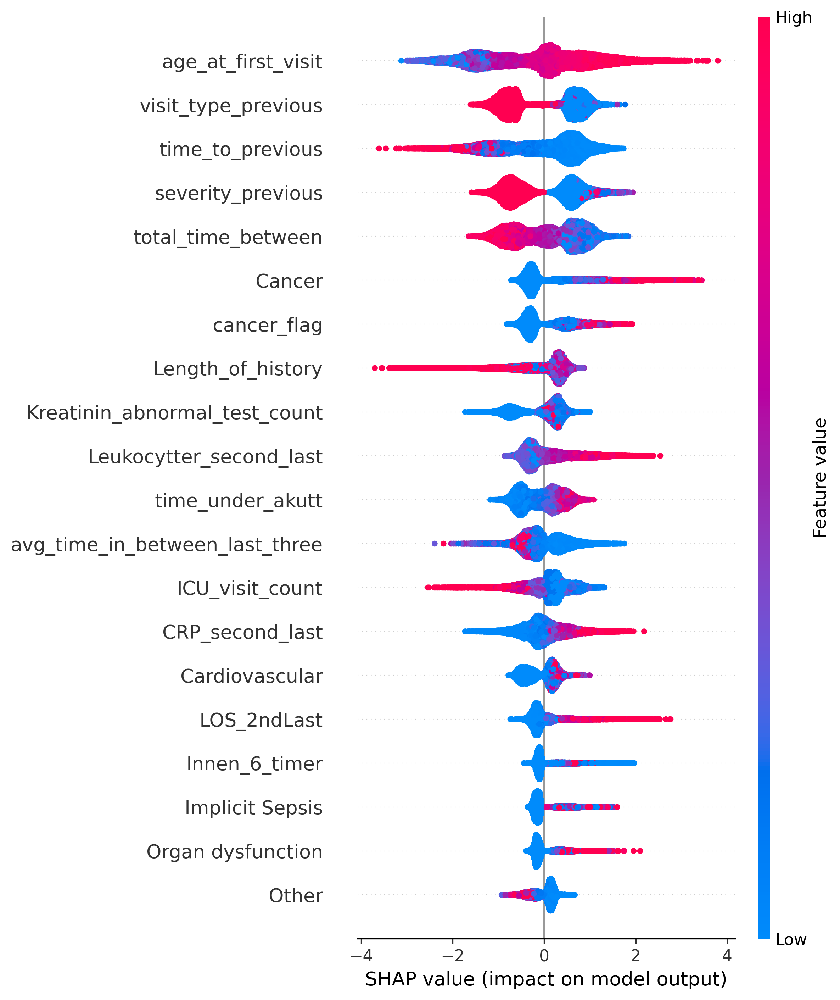

In [291]:
shap.summary_plot(shap_values, SMOTE_X_train, plot_type='dot', show = False, feature_names=feature_names)

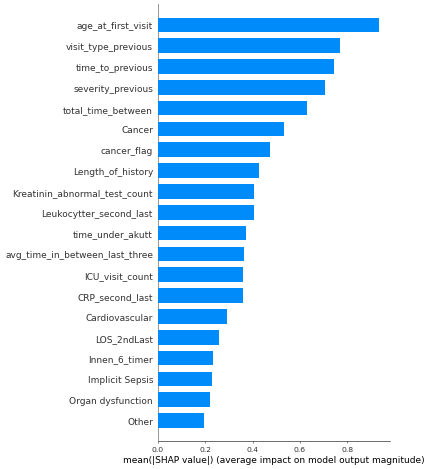

In [288]:
shap.summary_plot(shap_values, SMOTE_X_train, plot_type='bar', show = False, feature_names=feature_names)

In [285]:
mpl.rcParams['figure.dpi'] = 50

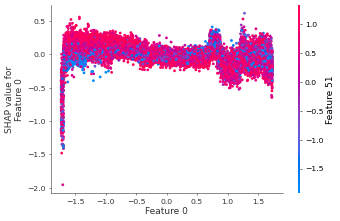

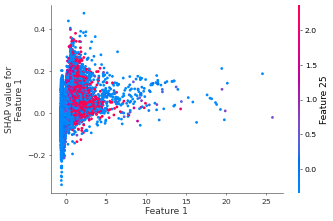

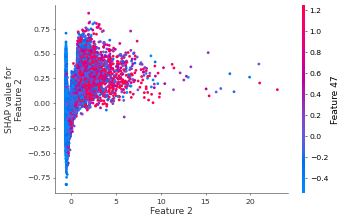

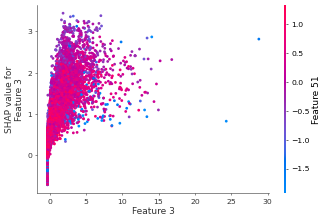

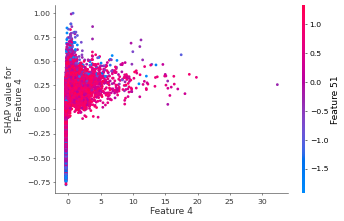

...

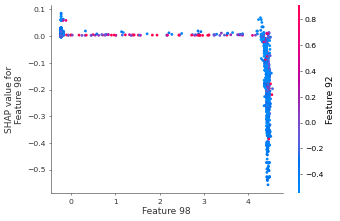

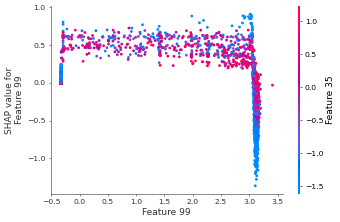

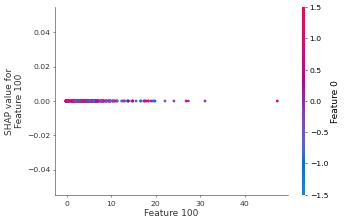

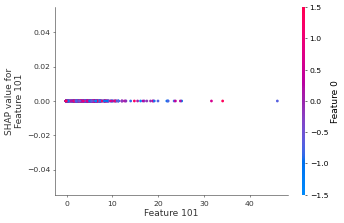

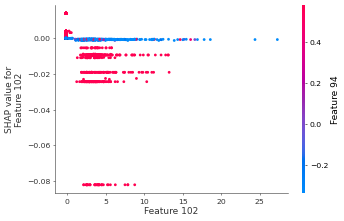

In [286]:
for i in range(103):
    shap.dependence_plot(i, shap_values, SMOTE_X_train, interaction_index='auto')

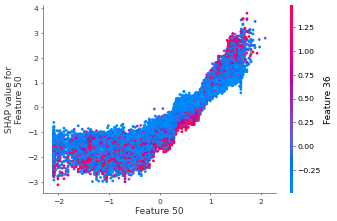

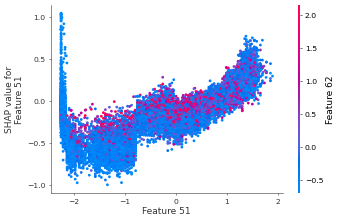

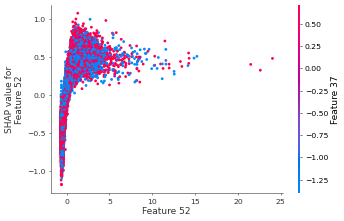

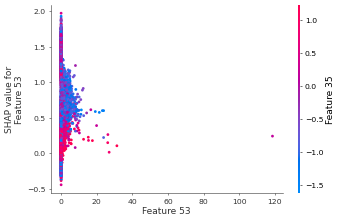

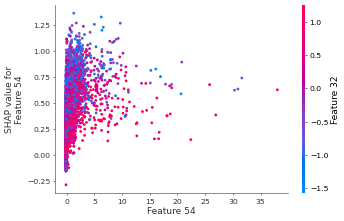

...

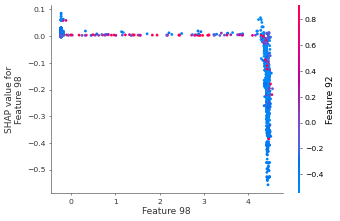

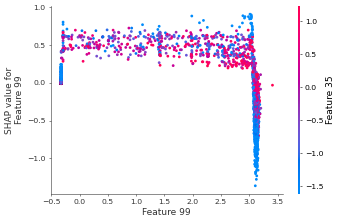

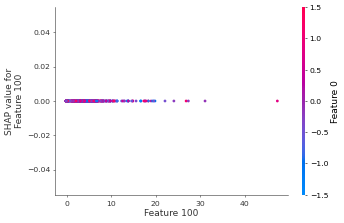

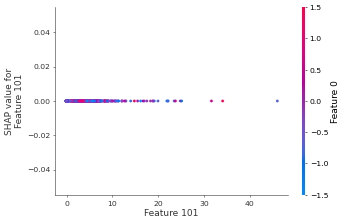

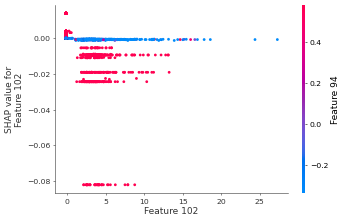

IndexError: index 103 is out of bounds for axis 1 with size 103

In [287]:
for i in range(103):
    i += 50
    shap.dependence_plot(i, shap_values, SMOTE_X_train, interaction_index='auto')

In [228]:
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test)


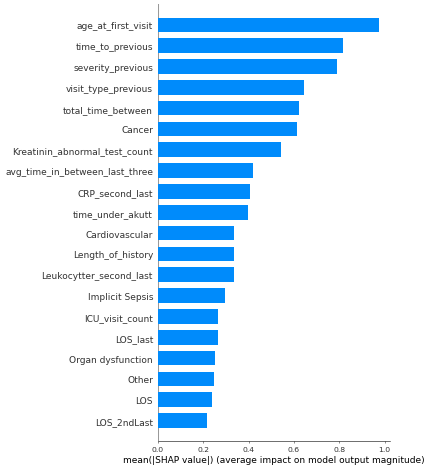

In [229]:
shap.summary_plot(shap_values, X_test, plot_type="bar")


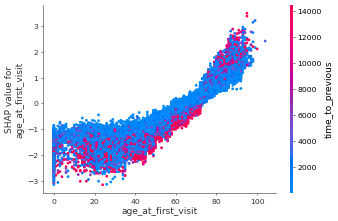

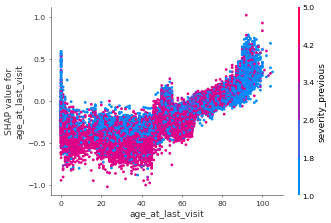

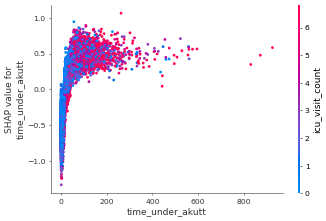

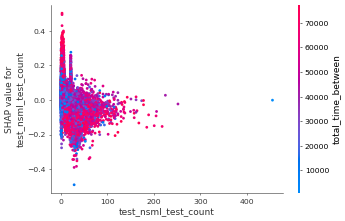

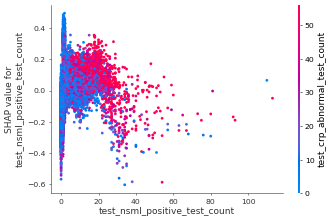

...

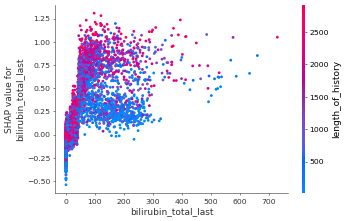

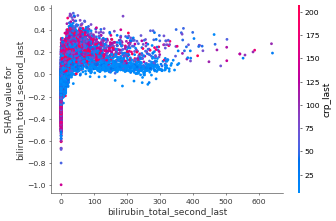

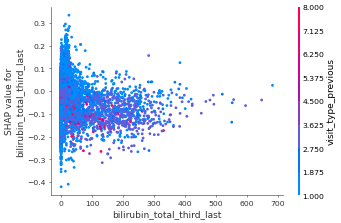

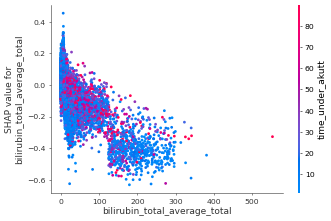

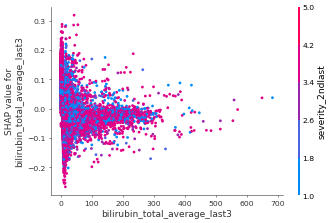

KeyboardInterrupt: 

In [78]:
for i in range(165):
    i += 50
    shap.dependence_plot(i, shap_values, SMOTE_X_train, interaction_index='auto')

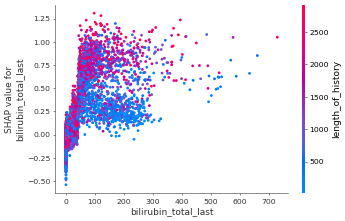

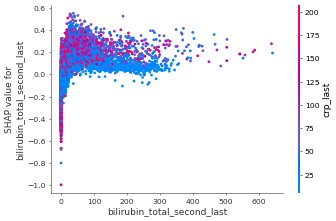

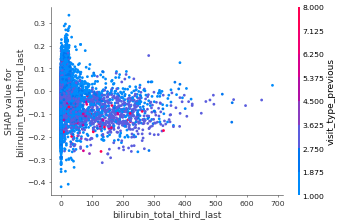

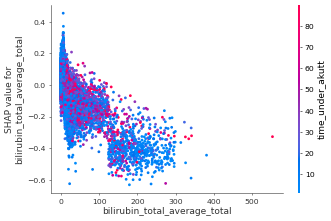

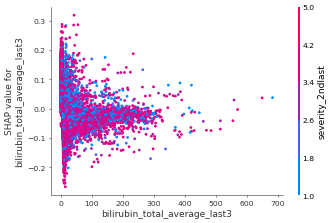

...

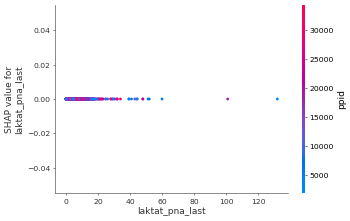

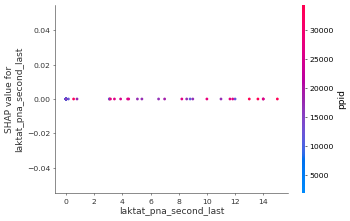

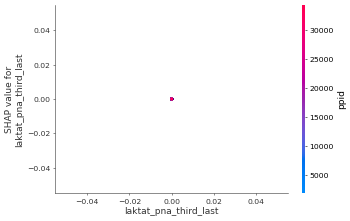

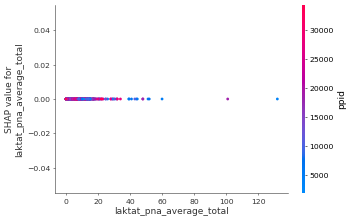

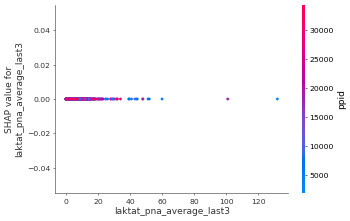

IndexError: index 165 is out of bounds for axis 1 with size 165

In [79]:
for i in range(165):
    i += 100
    shap.dependence_plot(i, shap_values, SMOTE_X_train, interaction_index='auto')

In [82]:
import lime
import lime.lime_tabular

In [83]:
# Create a LIME explainer for tabular data
explainer = lime.lime_tabular.LimeTabularExplainer(
    SMOTE_X_train.values, # The training data
    feature_names=feature_names, # The names of the features in the dataset
    class_names=['Low risk', 'High risk'], # The class labels
    categorical_features=None, # The indices of any categorical features (if any)
    categorical_names=None, # The names of categorical features (if any)
    kernel_width=3 # Kernel width for the LIME explainer
)

In [87]:
instance_idx = 3 # Replace this with the index of the instance you want to explain
instance = X_test.iloc[instance_idx].values

In [88]:
exp = explainer.explain_instance(
    instance,
    xgb_model.predict_proba, # The prediction function for your model
    num_features=10, # The number of top features you want to display
    top_labels=2 # The number of top labels to explain (if it's a multi-class problem)
)

In [289]:
exp.show_in_notebook(show_all=False)

### Regression using XGBoost

In [162]:
df = CaseLog

In [167]:
df = df.fillna(0)

In [168]:
df.columns.tolist()

['ppid',
 'entry_count',
 'LOS',
 'Cancer',
 'Cardiovascular',
 'Dementia',
 'Diabetes',
 'Explicit Sepsis',
 'Immune system',
 'Implicit Sepsis',
 'Infection',
 'Kidney dialysis',
 'Liver',
 'Lung',
 'Organ dysfunction',
 'Other',
 'admission_count',
 'daycare_count',
 'visit_count',
 'inpatient_count',
 'explicit_sepsis_flag',
 'infection_flag',
 'implicit_sepsis_flag',
 'diabetes_flag',
 'cardiovascular_flag',
 'cancer_flag',
 'lung_flag',
 'organ_dysfunction_flag',
 'kidney_dialysis_flag',
 'liver_flag',
 'dementia_flag',
 'immune_system_flag',
 'total_time_between',
 'avg_time_in_between',
 'avg_time_in_between_last_three',
 'Length_of_history',
 'time_to_previous',
 'severity_previous',
 'visit_type_previous',
 'time_between_last_2last',
 'severity_2ndlast',
 'visit_type_2ndlast',
 'LOS_2ndLast',
 'time_between_2last_3last',
 'severity_3rdlast',
 'visit_type_3rdlast',
 'LOS_3rdLast',
 'ICU_visit_count',
 'ICU_LOS',
 'kjønn',
 'age_at_first_visit',
 'age_at_last_visit',
 'time_und

In [190]:
# Set your target label for regression
Y = df['LOS_last'].values  # Replace 'LOS' with 'ICU_LOS' if you want to predict ICU LOS
X = df.drop(['Risk', 'LOS_last', 'ICU_LOS_last'], axis=1)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=300)


In [191]:
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_reg.fit(X_train, Y_train)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=12,
             num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [192]:
print("score on test: " + str(xgb_reg.score(X_test, Y_test)))

score on test: 0.7965860584833897


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


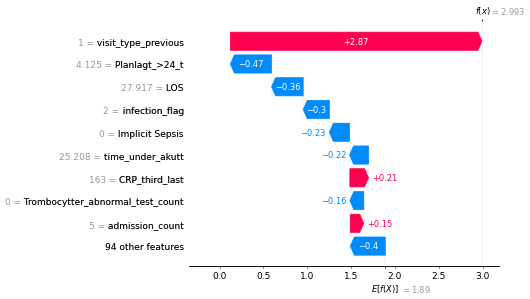

In [193]:
# Initialize the explainer
explainer = shap.Explainer(xgb_reg)

# Calculate SHAP values
shap_values = explainer(X)

# Plot summary of SHAP values
shap.plots.waterfall(shap_values[0])

In [183]:
print("X_train shape: ", X_train.shape)
print("SHAP values shape: ", shap_values.values.shape)


X_train shape:  (27371, 103)
SHAP values shape:  (34214, 103)


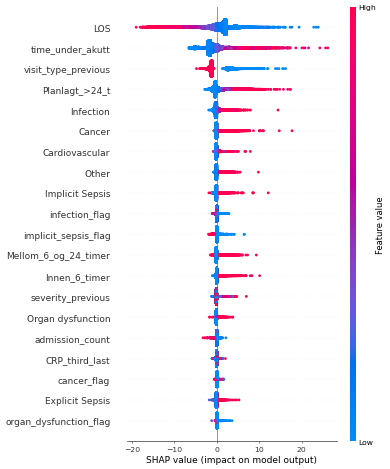

In [194]:
shap.summary_plot(shap_values, X, plot_type='dot')

In [195]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=feature_names,
    class_names=['LOS'],  # or ['ICU_LOS'] if you are predicting ICU LOS
    categorical_features=None,
    categorical_names=None,
    kernel_width=3,
    mode='regression'  # Set mode to regression
)


In [196]:
instance_idx = 5
instance = X_test.iloc[instance_idx].values


In [197]:
exp = explainer.explain_instance(
    instance,
    xgb_reg.predict,  # The prediction function for your model
    num_features=10
)


In [198]:
exp.show_in_notebook(show_all=False)


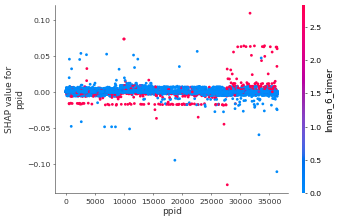

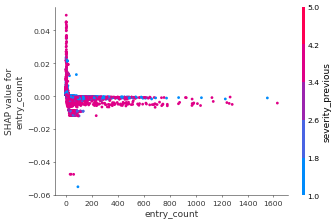

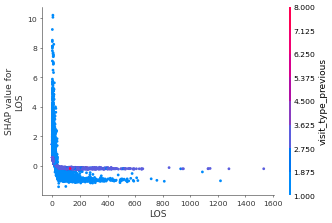

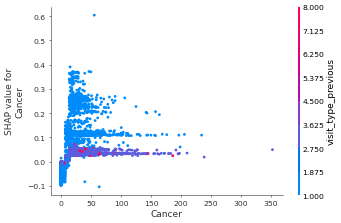

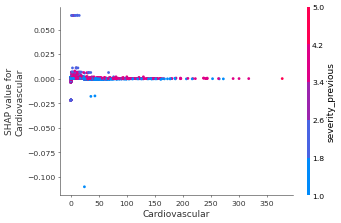

...

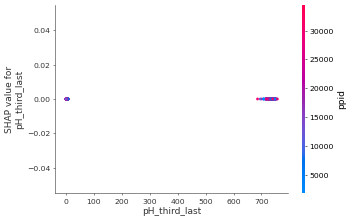

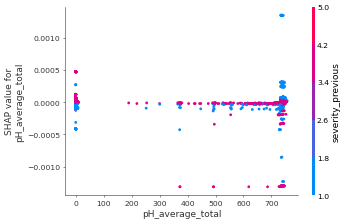

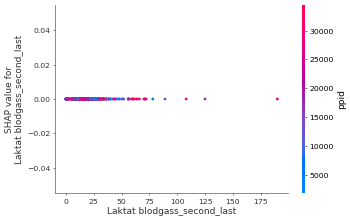

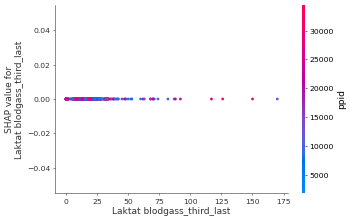

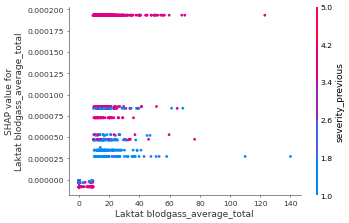

In [206]:

# Train the XGBoost model
model = xgb.train({"learning_rate": 0.01}, xgb.DMatrix(X_train, label=Y_train), 100)

# Explain the model's predictions using SHAP values
explainer = shap.Explainer(model)
shap_values_array = explainer(X_train).values

# Generate dependence plots for each feature



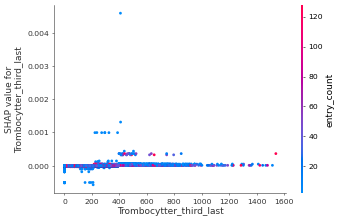

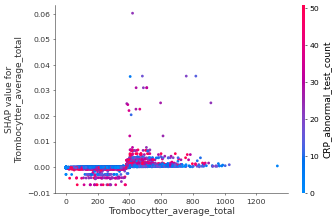

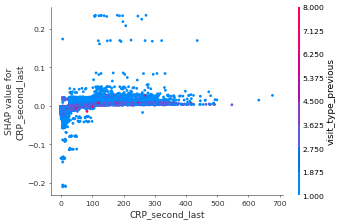

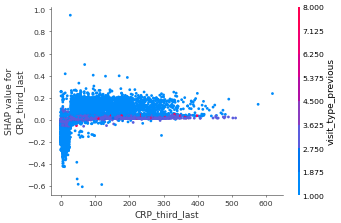

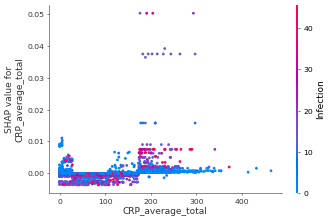

...

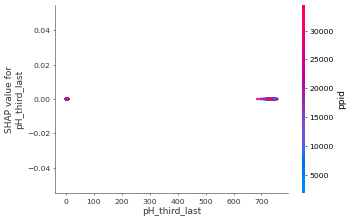

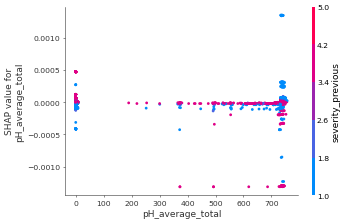

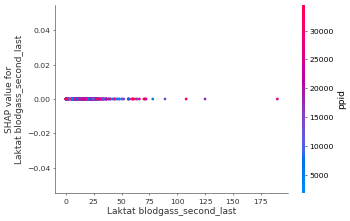

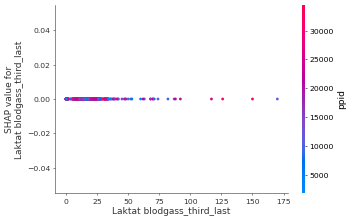

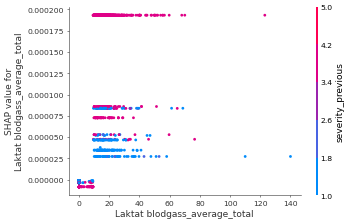

IndexError: index 103 is out of bounds for axis 1 with size 103

In [208]:
for i in range(X_train.shape[1]):
    i += 80
    shap.dependence_plot(i, shap_values_array, X_train, feature_names=X_train.columns)

In [213]:
df =  CaseLog
df = df.fillna(0)

In [214]:
grp = ['alive', 'implicit_death', 'explicit_death', 'infection_death', 'allcause_death']

tab = df.loc[df['Risk'].isin(grp)]
tab.Risk[tab.Risk == 'alive'] = 0
tab.Risk[tab.Risk == 'implicit_death'] = 1
tab.Risk[tab.Risk == 'explicit_death'] = 1
tab.Risk[tab.Risk == 'infection_death'] = 1
tab.Risk[tab.Risk == 'allcause_death'] = 1


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [215]:

from sklearn.linear_model import Lasso


Y = tab['Risk'].values
Y = Y.astype('int')
X = tab.drop('Risk', axis=1)

feature_names = np.array(X.columns)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=300)

oversample = SMOTE()
SMOTE_X_train, SMOTE_Y_train = oversample.fit_resample(X_train, Y_train)

# Perform LASSO feature selection
lasso = Lasso(alpha=0.1)
lasso.fit(SMOTE_X_train, SMOTE_Y_train)

# Select relevant features with non-zero coefficients
selected_features = feature_names[lasso.coef_ != 0]

# Subset the data to keep only selected features
SMOTE_X_train_selected = SMOTE_X_train[selected_features]
X_test_selected = X_test[selected_features]

# Train and evaluate the XGBoost model on the selected features
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(SMOTE_X_train_selected, SMOTE_Y_train)
y_pred = xgb_model.predict(X_test_selected)
print("score on test: " + str(accuracy_score(Y_test, y_pred)))


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


score on test: 0.9387858347386172


In [216]:
shap_values = shap.TreeExplainer(xgb_model).shap_values(SMOTE_X_train_selected)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


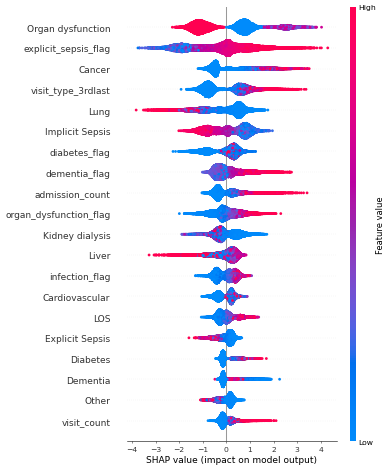

In [217]:
shap.summary_plot(shap_values, SMOTE_X_train_selected, plot_type='dot', show = False, feature_names=feature_names)

In [232]:
CaseLog.head(10)

,ppid,entry_count,LOS,Cancer,Cardiovascular,Dementia,Diabetes,Explicit Sepsis,Immune system,Implicit Sepsis,Infection,Kidney dialysis,Liver,Lung,Organ dysfunction,Other,admission_count,daycare_count,visit_count,inpatient_count,explicit_sepsis_flag,infection_flag,implicit_sepsis_flag,diabetes_flag,cardiovascular_flag,cancer_flag,lung_flag,organ_dysfunction_flag,kidney_dialysis_flag,liver_flag,dementia_flag,immune_system_flag,total_time_between,avg_time_in_between,avg_time_in_between_last_three,Length_of_history,time_to_previous,severity_previous,visit_type_previous,time_between_last_2last,severity_2ndlast,visit_type_2ndlast,LOS_2ndLast,time_between_2last_3last,severity_3rdlast,visit_type_3rdlast,LOS_3rdLast,ICU_visit_count,ICU_LOS,kjønn,age_at_first_visit,age_at_last_visit,time_under_akutt,Innen_6_timer,Mellom_6_og_24_timer,Planlagt_>24_t,Tilbakef_av_pas_fra_annet_sykeh.,nsml_test_count,nsml_positive_test_count,bcr_test_count,bcr_positive_test_count,Trombocytter_abnormal_test_count,CRP_abnormal_test_count,Leukocytter_abnormal_test_count,CRP-høysensitiv_abnormal_test_count,Kreatinin_abnormal_test_count,Bilirubin total_abnormal_test_count,pH_abnormal_test_count,Laktat blodgass_abnormal_test_count,Bilirubin ukonjugert_abnormal_test_count,Bilirubin konjugert_abnormal_test_count,Trombocyttantistoff_abnormal_test_count,Laktat blodgass venøst_abnormal_test_count,Laktat_abnormal_test_count,Trombocyttforlik_abnormal_test_count,pO2_abnormal_test_count,pH PNA_abnormal_test_count,pO2 PNA_abnormal_test_count,Laktat PNA_abnormal_test_count,Trombocytter_second_last,Trombocytter_third_last,Trombocytter_average_total,CRP_second_last,CRP_third_last,CRP_average_total,Leukocytter_second_last,Leukocytter_third_last,Leukocytter_average_total,CRP-høysensitiv_second_last,CRP-høysensitiv_third_last,CRP-høysensitiv_average_total,Kreatinin_second_last,Kreatinin_third_last,Kreatinin_average_total,Bilirubin total_second_last,Bilirubin total_third_last,Bilirubin total_average_total,pH_second_last,pH_third_last,pH_average_total,Laktat blodgass_second_last,Laktat blodgass_third_last,Laktat blodgass_average_total,Risk,ICU_LOS_last,LOS_last
0,1,17,27.916667,0.000000,5.708333,0.0,0.000000,0.000000,0.0,0.0,13.291667,0.0,0.0,10.416667,0.000000,0.000000,5,0,12,0,0,2,0,0,5,8,10,1,0,0,0,0,18791.0,1105.352941,1603.666667,783.208333,838.0,1,1,2040.0,4,3,0.000000,456.0,1.0,1.0,4.958333,2.0,31.0,1,79,81,25.208333,0.083333,0.000000,4.125000,0.000000,12,1.0,5.0,0.0,0.0,14.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,183.0,206.0,187.333333,66.0,163.0,52.166667,99.0,110.0,106.888889,0.0,0.0,0.0,60.0,84.0,71.733333,15.0,6.0,11.500000,0.0,0.0,0.0,0.0,0.0,0.0,allcause_death,21.0,1.500000
1,2,16,4.208333,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,3.000000,0.0,0.0,0.000000,0.000000,1.208333,3,0,13,0,0,1,0,0,0,0,1,0,0,0,0,0,53078.0,3317.375000,1278.333333,2211.832639,550.0,4,3,93.0,4,1,0.375000,672.0,1.0,1.0,0.291667,2.0,5.0,0,44,50,3.291667,0.000000,0.000000,0.916667,0.000000,6,3.0,2.0,0.0,1.0,4.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,133.0,179.666667,5.0,93.0,94.833333,88.0,71.0,76.500000,0.0,0.0,0.0,46.0,56.0,49.666667,5.0,0.0,4.000000,0.0,0.0,0.0,0.0,0.0,0.0,alive,2.0,0.000000
2,3,96,133.958333,0.000000,0.000000,0.0,0.000000,14.416667,0.0,0.0,53.208333,0.0,0.0,0.000000,0.000000,66.416667,20,4,72,0,12,12,0,0,0,0,0,0,0,0,0,0,90121.0,938.760417,295.000000,3487.031250,529.0,4,3,237.0,4,2,0.208333,411.0,4.0,3.0,0.000000,13.0,89.0,0,55,65,90.708333,0.041667,0.000000,43.291667,0.000000,9,0.0,4.0,0.0,1.0,13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,342.0,447.0,367.000000,58.0,99.0,86.857143,77.0,53.0,64.285714,0.0,0.0,0.0,73.0,64.0,58.800000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,alive,2.0,0.041667
3,4,57,20.166667,0.000000,0.166667,0.0,1.083333,0.000000,0.0,0.0,5.041667,0.0,0.0,0.000000,11.833333,2.041667,3,0,54,0,0,1,0,28,9,0,0,1,0,1,0,0,64443.0,1130.578947,615.666667,2686.020833,169.0,4,3,840.0,4,3,

In [233]:
CaseLog.to_csv('CaseLog_240423.csv')